In [197]:
%config Completer.use_jedi=False
import zipfile
import io
import requests
import pandas as pd
import numpy as np
import plotly.express as plx
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

seed=23


In [2]:
url = 'https://caelum-online-public.s3.amazonaws.com/2604-clustering-aplicado-recomendando-musicas-k-means/01/2604-dados.zip'
resposta = requests.get(url)
with zipfile.ZipFile(io.BytesIO(resposta.content)) as zf:
    zf.extractall('../src/data')
    

In [3]:
data = pd.read_csv('../src/data/Dados/Dados_totais.csv')
data_genre = pd.read_csv('../src/data/Dados/data_by_genres.csv')  
data_year = pd.read_csv('../src/data/Dados/data_by_year.csv')

In [4]:
print(data.shape)
data.head()

(20311, 19)


,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady


In [117]:
print(data_genre.shape)
data_genre.head(2)

(2973, 14)


,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000,5


In [118]:
data_genre1 = data_genre.drop(['key','mode','genres'], axis=1)
data_genre1.head(2)

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333
1,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000


In [119]:
print(data_year.shape)
data_year.head(2)

(21, 14)


,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049,7
1,1,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125,7


In [8]:
data_year = data_year[data_year["year"]>=2000].reset_index().drop('index', axis=1)

In [9]:
data_year.head(2)

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049,7
1,1,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125,7


In [10]:
data_year.isna().sum()

mode                0
year                0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
dtype: int64

In [11]:
plx.line(data_year, x='year', y=data_year.columns[[2,3,5,6,7,9]].tolist(), markers=True)

In [12]:
plx.imshow(data.corr(), text_auto=True, height=1000)

Padronização e Análise de componente principal

In [13]:
pca_pipeline = Pipeline([('Scaler',StandardScaler()),('PCA',PCA(n_components=2,random_state=seed))])
genre_embedding_pca = pca_pipeline.fit_transform(data_genre1)
variancia_explicada = pca_pipeline[1].explained_variance_ratio_.sum()
print(f'A variância explicada pelo PCA é {variancia_explicada} ' )
colunas_representadas = pca_pipeline[1].explained_variance_.sum()
print(f'O número de colunas representados pelo PCA é {colunas_representadas} ' )

A variância explicada pelo PCA é 0.4927066994726641 
O número de colunas representados pelo PCA é 5.421597305805697 


In [47]:
projection = pd.DataFrame(genre_embedding_pca)
plx.scatter(x=genre_embedding_pca[:,1],y=genre_embedding_pca[:,0],height=500, opacity=0.3)

In [108]:
def graf_silhueta_score(dataframe,max_clusters):
    df_silhouette = pd.DataFrame(genre_embedding_pca)
    score = []
    K = range(2, max_clusters)
    for k in K:
        km = KMeans(n_clusters=k)
        km.fit(dataframe)
        y_km = km.fit_predict(dataframe)
        score = np.append(score,silhouette_score(dataframe, y_km))
    return plx.line(x=K,y=score)

In [109]:
silhueta_score(pd.DataFrame(genre_embedding_pca),20)

In [48]:
projection = pd.DataFrame(genre_embedding_pca)
kmeans = KMeans(n_clusters=8, random_state=seed)
kmeans.fit(projection)
projection['Cluster'] = kmeans.predict(projection)
projection['Genero'] = data_genre.genres
projection = projection.rename(columns={0: "x", 1: "y"})
projection

,x,y,Cluster,Genero
0,5.910268,-0.011146,3,21st century classical
1,2.787093,4.498483,6,432hz
2,-0.757538,-1.258495,5,8-bit
3,1.020521,-0.931690,4,[]
4,0.753911,-0.999861,4,a cappella
...,...,...,...,...
2968,-0.475136,-0.017126,2,zolo
2969,-3.026756,-1.304983,5,zouglou
2970,-0.832511,-1.089726,5,zouk
2971,1.774790,-3.695233,4,zurich indie


In [49]:
projection = projection.rename(columns={0: "x", 1: "y"})
projection

,x,y,Cluster,Genero
0,5.910268,-0.011146,3,21st century classical
1,2.787093,4.498483,6,432hz
2,-0.757538,-1.258495,5,8-bit
3,1.020521,-0.931690,4,[]
4,0.753911,-0.999861,4,a cappella
...,...,...,...,...
2968,-0.475136,-0.017126,2,zolo
2969,-3.026756,-1.304983,5,zouglou
2970,-0.832511,-1.089726,5,zouk
2971,1.774790,-3.695233,4,zurich indie


In [50]:
plx.scatter(data_frame=projection,x='x',y='y', height=1000, opacity=1, color='Cluster', hover_data=['Genero'])

In [112]:
pca_pipeline_3d = Pipeline([('Scaler',StandardScaler()),('PCA',PCA(n_components=3,random_state=seed))])
genre_embedding_pca_3d = pca_pipeline_3d.fit_transform(data_genre1)
variancia_explicada_3d = pca_pipeline_3d[1].explained_variance_ratio_.sum()
print(f'A variância explicada pelo PCA é {variancia_explicada_3d} ' )
colunas_representadas_3d = pca_pipeline_3d[1].explained_variance_.sum()
print(f'O número de colunas representados pelo PCA é {colunas_representadas_3d} ' )


A variância explicada pelo PCA é 0.6068860197938042 
O número de colunas representados pelo PCA é 6.677992431129467 


In [116]:
graf_silhueta_score(pd.DataFrame(genre_embedding_pca_3d), 40)

In [114]:
projection_3d = pd.DataFrame(genre_embedding_pca_3d)
kmeans = KMeans(n_clusters=5, random_state=seed)
kmeans.fit(projection_3d)
projection_3d['Cluster'] = kmeans.predict(projection_3d)
projection_3d['Genero'] = data_genre.genres
projection_3d = projection_3d.rename(columns={0: "x", 1: "y",2:'z'})
projection_3d

,x,y,z,Cluster,Genero
0,5.910268,-0.011146,0.933087,2,21st century classical
1,2.787093,4.498483,1.522706,2,432hz
2,-0.757538,-1.258495,-1.386247,4,8-bit
3,1.020521,-0.931690,0.656772,0,[]
4,0.753911,-0.999861,-0.513547,0,a cappella
...,...,...,...,...,...
2968,-0.475136,-0.017126,0.021684,4,zolo
2969,-3.026756,-1.304983,-1.096359,4,zouglou
2970,-0.832511,-1.089726,-1.065865,4,zouk
2971,1.774790,-3.695233,2.409295,0,zurich indie


In [115]:
plx.scatter_3d(data_frame=projection_3d,x='x',y='y',z='z', height=1000, opacity=0.5, color='Cluster', hover_data=['Genero'])

In [120]:
data.head(2)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson


In [121]:
data_music = data.copy()
data_music.head(2)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson


In [57]:
data_music.artists.value_counts()

Drake                   170
Taylor Swift            156
Eminem                  147
Kanye West              136
BTS                     122
                       ... 
Of Monsters and Men       7
The Living Tombstone      7
Clean Bandit              7
Nelly Furtado             6
Empire of the Sun         6
Name: artists, Length: 875, dtype: int64

A coluna 'artists_song' é uma combinação de artista e nome da musica, resultando em valores unicos para as linhas

In [26]:
data_music.artists_song.value_counts()

Coldplay - Yellow                                                   1
Juice WRLD - Intro                                                  1
Carrie Underwood - The Champion - Bonus Track                       1
YoungBoy Never Broke Again - Cross Me (feat. Lil Baby and Plies)    1
Twenty One Pilots - Morph                                           1
                                                                   ..
Taylor Swift - Come Back...Be Here                                  1
Banda El Recodo - Me Gusta Todo De Ti                               1
Michael Bublé - The Christmas Song                                  1
Glee Cast - Smooth Criminal (Glee Cast Version) (feat. 2CELLOS)     1
Eminem - Darkness                                                   1
Name: artists_song, Length: 20311, dtype: int64

In [122]:
ohe = OneHotEncoder(dtype=int)
col_ohe = ohe.fit_transform(data[['artists']]).toarray()
col_ohe = pd.DataFrame(ohe.fit_transform(data_music[['artists']]).toarray())
columns = ohe.get_feature_names_out(['artists'])
col_ohe.columns = columns
col_ohe.head(2)

,artists_$NOT,artists_$uicideBoy$,artists_*NSYNC,artists_2 Chainz,artists_21 Savage,artists_2Pac,artists_3 Doors Down,artists_311,artists_3OH!3,artists_5 Seconds of Summer,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [123]:
data_music1 = data.drop(['artists','id','name','artists_song','explicit'],axis=1)
data_music1.head(2)

,valence,year,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
0,0.285,2000,0.00239,0.429,266773,0.661,0.000121,11,0.2340,-7.227,1,84,0.0281,173.372
1,0.613,2000,0.14300,0.843,270507,0.806,0.000000,4,0.0771,-5.946,0,80,0.2690,94.948


In [29]:
data_music_dummies = pd.concat([data_music1, col_ohe], axis=1)
data_music_dummies.describe()

,valence,year,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
count,20311.000000,20311.000000,20311.000000,20311.000000,2.031100e+04,20311.000000,20311.000000,20311.000000,20311.000000,20311.000000,...,20311.000000,20311.000000,20311.000000,20311.000000,20311.000000,20311.000000,20311.000000,20311.000000,20311.000000,20311.000000
mean,0.481928,2010.183201,0.242799,0.587702,2.286290e+05,0.650766,0.060173,5.239673,0.194004,-7.083095,...,0.000542,0.000788,0.001034,0.001576,0.002166,0.001034,0.000542,0.000542,0.000591,0.000739
std,0.246413,6.063968,0.284416,0.171322,7.046523e+04,0.221774,0.199315,3.583479,0.157758,4.320102,...,0.023266,0.028057,0.032139,0.039662,0.046494,0.032139,0.023266,0.023266,0.024300,0.027166
min,0.000000,2000.000000,0.000000,0.000000,3.030100e+04,0.000000,0.000000,0.000000,0.000000,-60.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.288000,2005.000000,0.016700,0.477000,1.920000e+05,0.516000,0.000000,2.000000,0.097600,-8.110000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.472000,2010.000000,0.114000,0.596000,2.216270e+05,0.680000,0.000002,5.000000,0.128000,-6.072000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.672000,2015.000000,0.395000,0.714000,2.561330e+05,0.826000,0.000512,8.000000,0.248000,-4.629500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,2020.000000,0.996000,0.986000,2.558287e+06,0.999000,1.000000,11.000000,0.997000,1.483000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [124]:
A = StandardScaler().fit_transform(data_music_dummies)
pd.DataFrame(A).describe().head(2)

,0,1,2,3,4,5,6,7,8,9,...,879,880,881,882,883,884,885,886,887,888
count,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,...,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04,2.031100e+04
mean,1.539259e-16,1.092594e-14,5.597304e-17,-7.556360e-16,7.626326e-17,1.679191e-16,4.757708e-17,-1.039000e-16,-3.330396e-16,-6.996630e-17,...,-1.959056e-17,1.189427e-17,-8.395956e-18,-2.168955e-17,9.620366e-18,-9.095619e-18,-1.609225e-17,-1.539259e-17,4.897641e-18,-9.445450e-18


In [31]:
pca_pipeline_musics = Pipeline([('Scaler',StandardScaler()),('PCA',PCA(n_components=0.7,svd_solver='full'))])
music_embedding_pca = pca_pipeline_musics.fit_transform(data_music_dummies)
music_embedding_pca

array([[ 1.47967654e-01,  7.79319994e-01,  1.96062948e+00, ...,
        -3.89083773e-02,  1.71884948e-12,  5.50211744e-13],
       [-1.42411952e+00, -6.20743741e-02, -1.38823720e+00, ...,
        -3.47803633e-02, -1.80470318e-12, -1.92446596e-12],
       [-1.01948060e+00,  5.37722376e-01,  9.66761914e-01, ...,
        -1.44005702e-02, -2.56083087e-13,  7.49280573e-14],
       ...,
       [ 7.95990389e-01, -1.09306555e+00,  4.47088567e-01, ...,
        -1.72294006e-02, -1.14177998e-11,  5.01634495e-11],
       [ 9.33846265e-02, -3.01453697e+00, -2.77082962e-01, ...,
         1.38417776e-01,  1.60205854e-11, -2.86960047e-12],
       [-9.07277738e-01, -1.23133437e+00,  1.34785963e+00, ...,
        -1.38119233e-02,  1.24483127e-12, -1.31021123e-12]])

In [125]:
variancia_explicada_musics = pca_pipeline_musics[1].explained_variance_ratio_.sum()
print(f'A variância explicada pelo PCA é {variancia_explicada_musics} ' )
colunas_representadas_musics = pca_pipeline_musics[1].explained_variance_.sum()
print(f'O número de colunas representados pelo PCA é {colunas_representadas_musics} ' )

A variância explicada pelo PCA é 0.7002552102882581 
O número de colunas representados pelo PCA é 622.5575331959881 


In [137]:
pd.DataFrame(music_embedding_pca).head(2)

,0,1,2,3,4,5,6,7,8,9,...,603,604,605,606,607,608,609,610,611,612
0,0.147968,0.779320,1.960629,-1.001750,0.398284,0.731671,-0.863866,-0.246584,-1.111290,-2.710563,...,-0.031448,-0.004906,0.011369,0.005317,-0.010714,-0.002491,0.021885,-0.038908,1.718849e-12,5.502117e-13
1,-1.424120,-0.062074,-1.388237,2.502041,0.157467,1.148021,0.036412,-1.247562,0.663662,-1.636816,...,-0.056735,0.016686,-0.014690,-0.018323,-0.034134,-0.022409,0.008324,-0.034780,-1.804703e-12,-1.924466e-12


In [138]:
projection_musics = pd.DataFrame(music_embedding_pca)
kmeans_m = KMeans(n_clusters=50, random_state=seed)
kmeans_m.fit(projection_musics)
data['Cluster'] = kmeans_m.predict(projection_musics)
projection_musics['Cluster'] = kmeans_m.predict(projection_musics)
projection_musics['artists'] = data.artists
projection_musics['song'] = data.artists_song
projection_musics.head(2)

,0,1,2,3,4,5,6,7,8,9,...,606,607,608,609,610,611,612,Cluster,artists,song
0,0.147968,0.779320,1.960629,-1.001750,0.398284,0.731671,-0.863866,-0.246584,-1.111290,-2.710563,...,0.005317,-0.010714,-0.002491,0.021885,-0.038908,1.718849e-12,5.502117e-13,39,Coldplay,Coldplay - Yellow
1,-1.424120,-0.062074,-1.388237,2.502041,0.157467,1.148021,0.036412,-1.247562,0.663662,-1.636816,...,-0.018323,-0.034134,-0.022409,0.008324,-0.034780,-1.804703e-12,-1.924466e-12,32,OutKast,OutKast - Ms. Jackson


In [139]:
plx.scatter(data_frame=projection_musics,x=0,y=1, height=1000, opacity=1, color='Cluster', hover_data=['song'])

In [140]:
plx.scatter_3d(data_frame=projection_musics,x=0,y=1,z=2, height=1000, opacity=0.5, color='Cluster', hover_data=['song','artists'])

In [131]:

musica = 'Red Hot Chili Peppers - Californication'
cluster_musica = data.loc[data.artists_song=='Red Hot Chili Peppers - Californication'].Cluster.values[0]
recomendadas = projection_musics[projection_musics.Cluster==cluster_musica][[0,1,2,'song']]
x = projection_musics[projection_musics['song']==musica][0].values[0]
y = projection_musics[projection_musics['song']==musica][1].values[0]
z = projection_musics[projection_musics['song']==musica][2].values[0]
distancia = euclidean_distances([[x,y,z]],recomendadas[[0,1,2]].values)
recomendadas['id'] = data.id
recomendadas['distancia'] = distancia[0]
recomendadas.sort_values(by='distancia')

,0,1,2,song,id,distancia
17504,-0.829610,2.001655,0.806797,Red Hot Chili Peppers - Californication,23EKk7ESb97Z5bFBlkuM56,0.000000
10287,-0.768629,2.098672,0.829145,Seether - Hang On,6FjOEtsWcmuOksloxG0xx5,0.116750
82,-0.819177,2.178557,0.881336,3 Doors Down - Loser,1aC1IBAETh2XYGOE8kCC6t,0.192249
10112,-0.871199,1.889889,0.651407,The White Stripes - Black Math,47daaR9V5NnoSo68Geb8wm,0.195875
12223,-0.627649,2.073450,0.719579,Breaking Benjamin - Break My Fall,3llwKWXLIIqqceJhK6J4zm,0.231409
...,...,...,...,...,...,...
13867,0.788569,-0.098353,-6.100777,The Countdown Kids - London Bridge Is Falling ...,2kxLqDHewx18RR0AwMjERG,7.398859
15512,1.419582,-0.271018,-6.105897,The Countdown Kids - Baa-Baa Black Sheep,36vcq48Pa24MOPzhOxwZPz,7.616380
8069,2.161505,-0.581336,-5.714748,The Countdown Kids - The Itsy Bitsy Spider,5HbkIW3Off36CE0f6gqqxA,7.625559
5754,1.523867,-1.030698,-5.793318,The Countdown Kids - Five Little Monkeys,5c6kyPkschzliAgwan2hxw,7.635151


In [132]:
data.artists.unique().shape

(875,)

In [133]:
import spotipy
SpotifyOAuth = spotipy.oauth2.SpotifyOAuth
SpotifyClientCredentials = spotipy.oauth2.SpotifyClientCredentials

In [134]:
scope = 'user-library-read playlist-modify-private'
OAuth = SpotifyOAuth(scope=scope,
                     client_secret='02abf9798f8d4efd8d587f8000931698',
                     client_id='0ddce304717940e684d5edee1ecf4df6',
                     redirect_uri='http://localhost:5000/callback')

In [135]:
client_credential_manager = SpotifyClientCredentials(client_id='0ddce304717940e684d5edee1ecf4df6',
                                                     client_secret='02abf9798f8d4efd8d587f8000931698')
sp = spotipy.Spotify(client_credentials_manager=client_credential_manager)

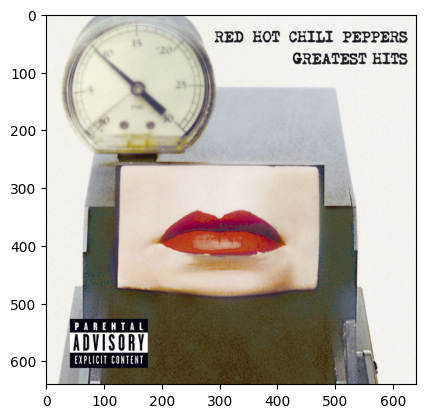

In [199]:
from PIL import Image
id_musica = list(data.id[data.artists_song == musica])[0]
track = sp.track(id_musica)
url = track['album']['images'][0]['url']
name = track['name']
resposta = requests.get(url)
image = Image.open(io.BytesIO(requests.get(url).content))
plt.figure()
plt.imshow(image)
plt.show()

In [182]:
data.id[data.artists_song == musica])

17504    23EKk7ESb97Z5bFBlkuM56
Name: id, dtype: object

In [202]:
def id_recomendadas(playlist_id):
    url = []
    name = []
    for pid in playlist_id:
        track = sp.track(pid)
        url.append(track['album']['images'][0]['url'])
        name.append(track['name'])
    return name, url


In [223]:
name, url = id_recomendadas(recomendadas.id.head(10))

In [226]:
url

['https://i.scdn.co/image/ab67616d0000b2732350e31bc346a6c20e9de166',
 'https://i.scdn.co/image/ab67616d0000b2732868c4713a3912fd476b42f1',
 'https://i.scdn.co/image/ab67616d0000b273dbb3dd82da45b7d7f31b1b42',
 'https://i.scdn.co/image/ab67616d0000b2732b222dcd5c4fcac7c0e81da2',
 'https://i.scdn.co/image/ab67616d0000b273a7ad64a69a42647de9dd0dad',
 'https://i.scdn.co/image/ab67616d0000b273dbb3dd82da45b7d7f31b1b42',
 'https://i.scdn.co/image/ab67616d0000b273a6cb8fab778e1efc406a5909',
 'https://i.scdn.co/image/ab67616d0000b2739449f9491c364d28a9668e17',
 'https://i.scdn.co/image/ab67616d0000b273a7ad64a69a42647de9dd0dad',
 'https://i.scdn.co/image/ab67616d0000b273582d56ce20fe0146ffa0e5cf']

In [264]:
def visualise_songs(name, url):
    plt.figure(figsize=(10,25))
    columns = 5
    for i, u in enumerate(url):
        response = requests.get(u)
        image = Image.open(io.BytesIO(response.content))
        ax = plt.subplot(len(u)//columns+1, columns, i+1)
        plt.imshow(image)
        ax.get
        plt.axis('off')
        plt.title(name[i])
        plt.tight_layout(h_pad=0.1, w_pad=0)
        plt.subplots_adjust(wspace=None,hspace=None)
    plt.show()

In [316]:
import matplotlib.axes as ax
def visualise_songs(name, url):
    plt.figure(figsize=(10,25))
    columns = 5
    for i, u in enumerate(url):
        response = requests.get(u)
        image = Image.open(io.BytesIO(response.content))
        axs = plt.subplot(len(u)//columns+1, columns, i+1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(name[i],fontdict={'fontsize':7})
        plt.tight_layout(h_pad=1, w_pad=0)
        plt.subplots_adjust(wspace=None,hspace=None)
        plt.contour()
#                      colors=['#808080', '#A0A0A0', '#C0C0C0'], extend='both')
    plt.show()

IndexError: tuple index out of range

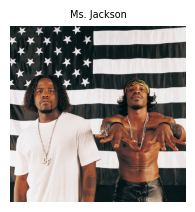

In [317]:
visualise_songs(name, url)

In [319]:
!pip install matplotlib==3.2.2 --user

  Using cached matplotlib-3.2.2.tar.gz (40.3 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py install for matplotlib: started
  Running setup.py install for matplotlib: finished with status 'error'


  DEPRECATION: matplotlib is being installed using the legacy 'setup.py install' method, because it does not have a 'pyproject.toml' and the 'wheel' package is not installed. pip 23.1 will enforce this behaviour change. A possible replacement is to enable the '--use-pep517' option. Discussion can be found at https://github.com/pypa/pip/issues/8559
  error: subprocess-exited-with-error
  
  Running setup.py install for matplotlib did not run successfully.
  exit code: 1
  
  [577 lines of output]
  
  Edit setup.cfg to change the build options; suppress output with --quiet.
  
  BUILDING MATPLOTLIB
    matplotlib: yes [3.2.2]
        python: yes [3.10.2 (tags/v3.10.2:a58ebcc, Jan 17 2022, 14:12:15) [MSC
                    v.1929 64 bit (AMD64)]]
      platform: yes [win32]
   sample_data: yes [installing]
         tests: no  [skipping due to configuration]
           agg: yes [installing]
         tkagg: yes [installing; run-time loading from Python Tcl/Tk]
        macosx: no  [Mac OS-